#Aleksas Murauskas 260718389
#Luke Ma 260745824
#Assignment 2
#1 Harris Corner Detection 

###Portions done by Aleks Murauskas, parts 2,3
There is some other code in parts 1 and 4, those were attempts to debug or create expected outputs. Please ignore those as Parts 1 and 4 will be submitted by Luke. 

####1 Checkerboard image Figure:1(a) (Input image). Change the threshold value to get detected corners similar to Figure:1(a) (Harris Corner). Observe and report the effect of changing threshold values. Show the detected corners for at least three different threshold values (T).

In [ ]:
import cv2,math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab import drive

#Looks to be mostly tutorial 3/4 stuff 

def display_img(image, title_input):
    plt.figure(figsize = (10, 10))
    plt.imshow(image)
    plt.xticks([]) 
    plt.yticks([]) 
    plt.title(title_input, fontsize = 20)

drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/ECSE 415/Assignment-2/'

img_path= drive_path+'images/checkerboard.png'
base_img = cv2.imread(img_path)

active_img = img.copy()



Mounted at /content/drive


####2 Shape image Figure:1(b). Try different values of thresholds and report your observations. Show detected corners for at least three different threshold values.

####3 Take any one face image from Google Face thumbnail collection dataset. Apply the Harris corner detector on this image. Try different values of thresholds and report your observations. Show the detected corners for at least four different threshold values.

#2 Invariance of SIFT Features

###2.1 Invariance Under Scale

####1 Compute SIFT keypoints for the reference image.

In [ ]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16
#Needed for SIFT to properly run

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


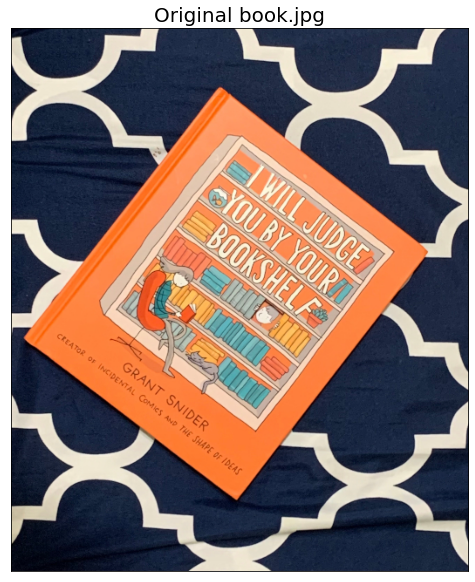

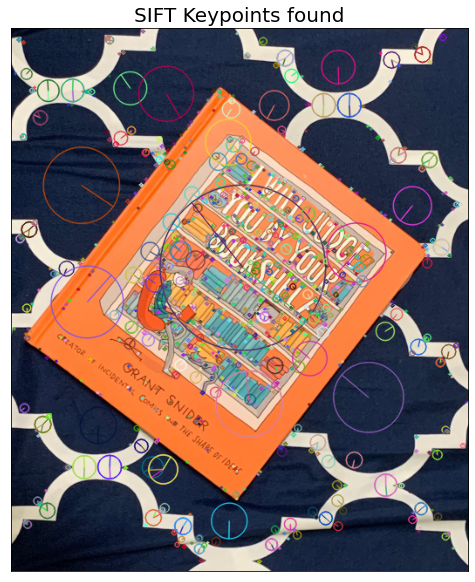

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.patches as mpatches
from google.colab import drive

def display_img(image, title_input): #Prints images to output
    plt.figure(figsize = (10, 10))
    plt.imshow(image)
    plt.xticks([]) 
    plt.yticks([]) 
    plt.title(title_input, fontsize = 20)

drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/ECSE 415/Assignment-2/'

img_path= drive_path+'images/book.jpg'
base_img = cv2.imread(img_path) #obtain image 

base_img = cv2.cvtColor(base_img, cv2.COLOR_BGR2RGB)
disp_img = base_img.copy()
sift = cv2.xfeatures2d.SIFT_create()#Create Sift Object

keypoints = sift.detect(base_img,None) #Find Keypoints

cv2.drawKeypoints(base_img, keypoints, disp_img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
display_img(base_img,"Original book.jpg")
display_img(disp_img, "SIFT Keypoints found")

####2 Scale reference image using scaling factors of (0.2, 0.8, 2, 5). This should result in a total of 4 different transformed images. Display scaled images

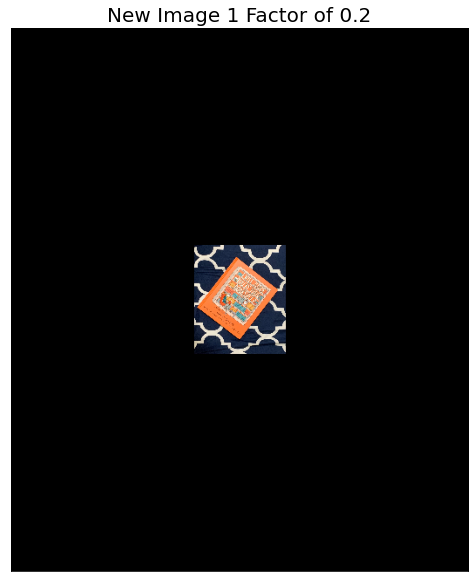

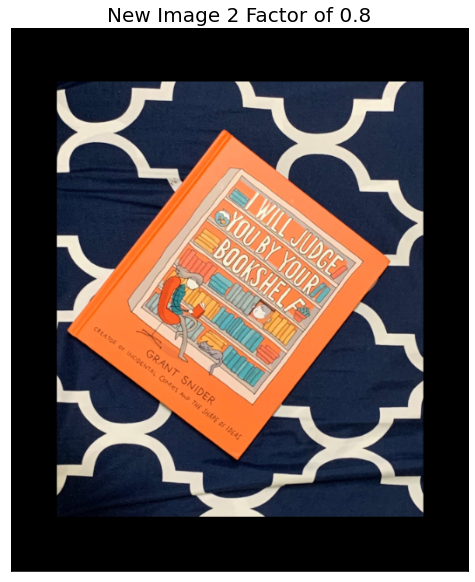

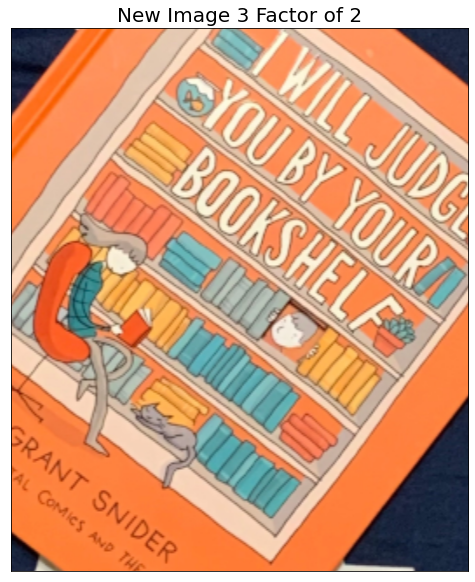

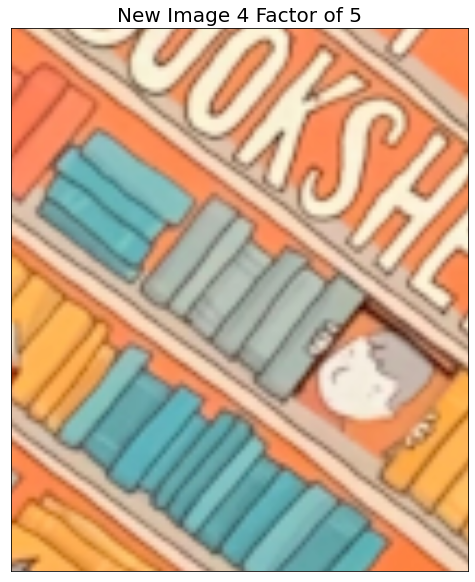

In [ ]:
h,w = base_img.shape[0:2]
factors = [0.2,0.8,2,5]
images =[]

for x in range(4):
  temp_matrix = cv2.getRotationMatrix2D((w/2,h/2),0,factors[x]) #Create a matrix to warp the image, angle =0, scale =factor
  new_img=cv2.warpAffine(base_img,temp_matrix,(w,h))#warp image 
  images.append(new_img)
  tit = "New Image "+ str(x+1)+" Factor of "+ str(factors[x])
  display_img(new_img, tit)#Display scaled images 

####3 Compute SIFT keypoints for all (total 4) transformed images.

In [ ]:
keypoints=[]
descriptors=[]
#Holds the values for each image 
for x in range(4):#find keypoints and descriptors for each scaled image
  temp_key = sift.detect(images[x],None)
  temp_key, temp_desc = sift.compute(images[x],temp_key)
  keypoints.append(temp_key)
  descriptors.append(temp_desc) 
  num_keys= str(len(temp_key)) 
  #Print Results of Keypoints found
  print("Image Number: "+str(x+1)+", Scaling Factor: "+str(factors[x])+ ", Keypoints found: "+str(num_keys))

Image Number: 1, Scaling Factor: 0.2, Keypoints found: 158
Image Number: 2, Scaling Factor: 0.8, Keypoints found: 968
Image Number: 3, Scaling Factor: 2, Keypoints found: 2737
Image Number: 4, Scaling Factor: 5, Keypoints found: 839


####4 Match all keypoints of the reference image to the transformed images using a brute-force method.

In [ ]:
bf =cv2.BFMatcher() #create matcher

base_keys = sift.detect(base_img,None)
base_keys, base_desc = sift.compute(base_img,base_keys) 

matches =[]#Holds list of matches 
for x in range(4):
  temp_match = bf.match(base_desc, descriptors[x])
  matches.append(temp_match)#Add found matches to the list


####5 Sort matching key points according to the matching distance.

In [ ]:
for x in range(4): 
  matches[x] = sorted(matches[x],key=lambda x:x.distance)#Sort on distance 

####6 Display the top ten matched keypoints for each pair of the reference image and a transformed image.

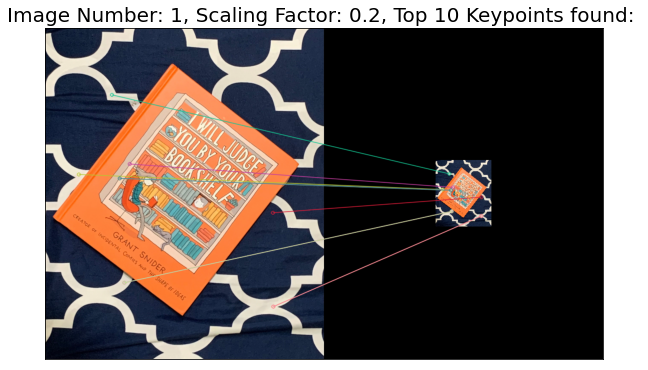

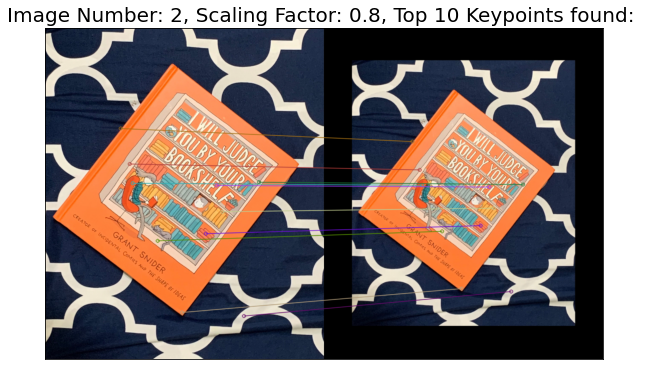

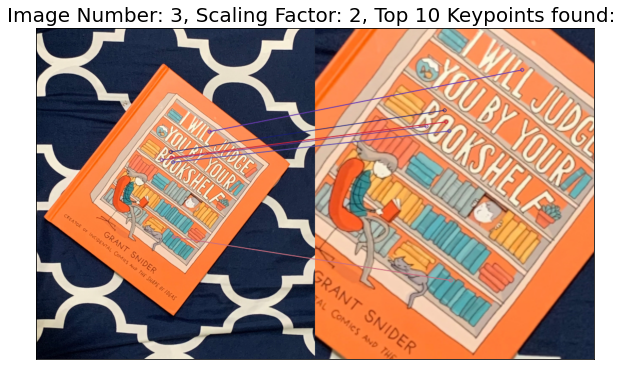

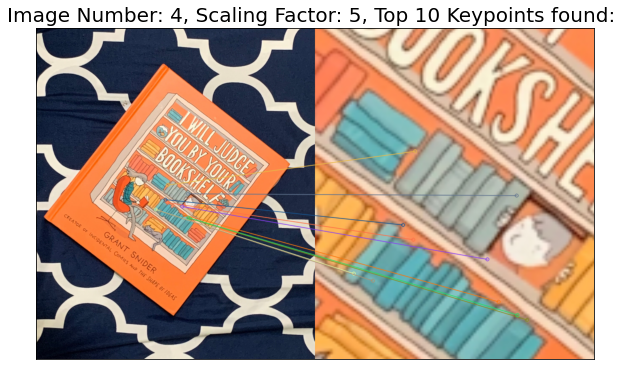

In [ ]:
for x in range(4):
  #Draw matches to a new image
  new_img =cv2.drawMatches(base_img,base_keys, images[x],keypoints[x],matches[x][:10],None,flags=2)
  #Create Title
  tit ="Image Number: "+str(x+1)+", Scaling Factor: "+str(factors[x])+ ", Top 10 Keypoints found: "
  display_img(new_img,tit)

####7 Plot the matching distance for the top 100 matched keypoints. Plot indices of keypoints on the x-axis and corresponding matching distance on the y-axis.

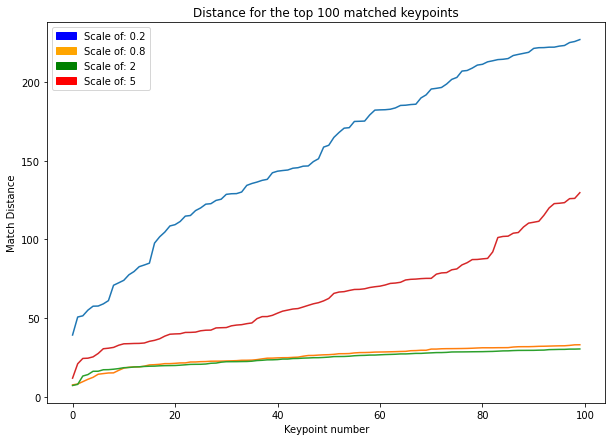

In [ ]:
line_color = ['blue', 'orange','green','red']
lines =[]
x_axis = np.arange(100) #Set X axis size
plt.figure(figsize=(10,7))
for x in range(4):
  temp_dist =[]
  for a,b in enumerate(matches[x]): #gather all matches 
    temp_dist.append(b.distance)
  plt.plot(x_axis, temp_dist[:100],label='Line 2')#Only first 100
  plt.title("Distance for the top 100 matched keypoints")
  plt.xlabel("Keypoint number")
  plt.ylabel("Match Distance")
  line= mpatches.Patch(color=line_color[x], label='Scale of: '+str(factors[x]))
  #Create and add a line to the graph
  lines.append(line)
#Create Legend
plt.legend(handles=[lines[0],lines[1], lines[2], lines[3]])
plt.show()

####8 Discuss the trend in the plotted results. What is the eect of increasing the scale on the matching distance? Reason the cause.

The Closer the scale factor of the new image is to the value 1, The smaller the matching distance will be.

When the scale is too large, the image appears blurred, and this loss of details results in a loss of matches.  

When the scale is too small, the keypoints found will cover a larger area than in the original scale, losing some keypoints in the process. 

As shown above, scale factors of 0.8 and 2 acted similarly, but 0.2 and 5 have considerably worse matching distances. 

###2.2 Invariance Under Rotation

####1 Compute SIFT keypoints for the reference image.

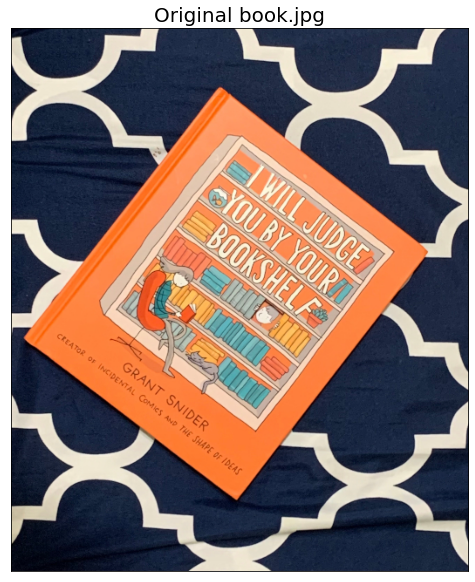

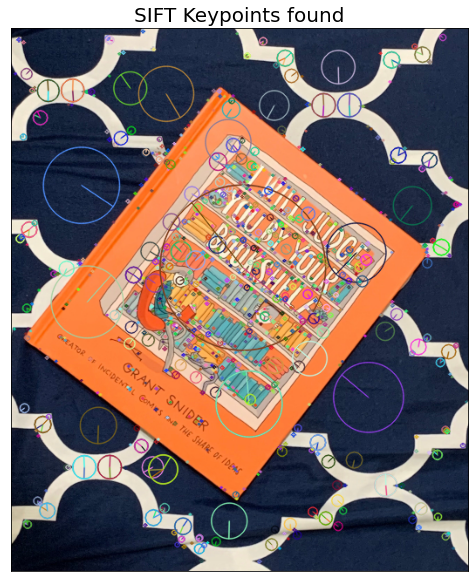

In [ ]:
img_path= drive_path+'images/book.jpg'
base_img = cv2.imread(img_path)

base_img = cv2.cvtColor(base_img, cv2.COLOR_BGR2RGB)
disp_img = base_img.copy()
sift = cv2.xfeatures2d.SIFT_create()#Create sifter

keypoints = sift.detect(base_img,None)
#Draw Keypoints on image 
cv2.drawKeypoints(base_img, keypoints, disp_img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
display_img(base_img,"Original book.jpg")
display_img(disp_img, "SIFT Keypoints found")

####2 Rotate reference image at the angle of (10, 90, 130, 180). Display rotated images.

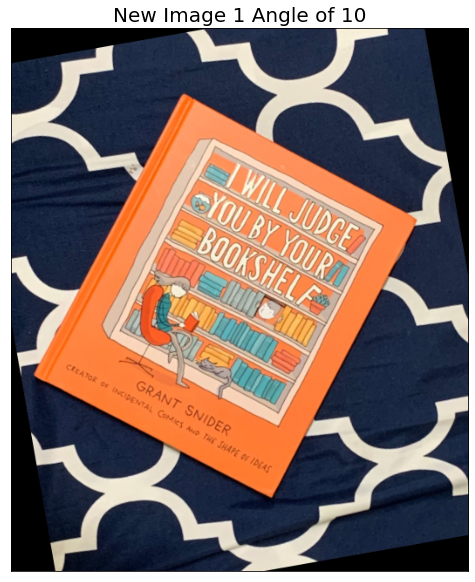

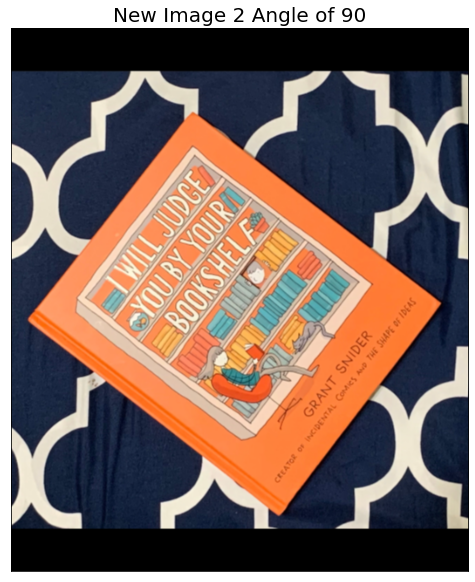

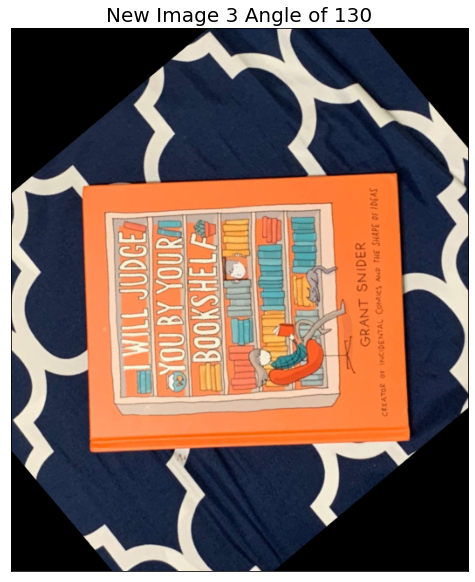

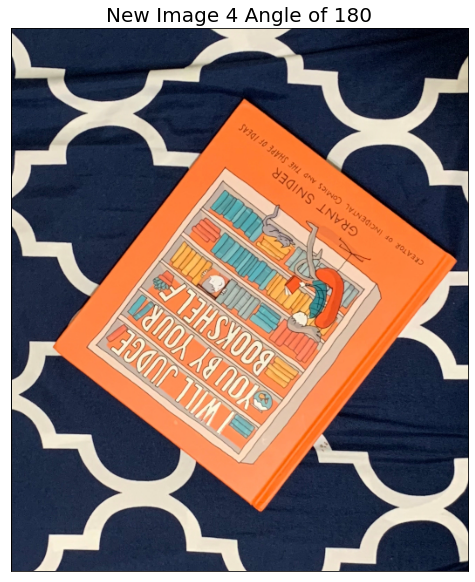

In [ ]:
h,w = base_img.shape[0:2]
angles = [10,90,130,180]
images =[]

for x in range(4):
  temp_matrix = cv2.getRotationMatrix2D((w/2,h/2),angles[x],1)#Create matrix to rotate on an array of angles
  new_img=cv2.warpAffine(base_img,temp_matrix,(w,h))#warp by given Matrix
  images.append(new_img)
  tit = "New Image "+ str(x+1)+" Angle of "+ str(angles[x])
  display_img(new_img, tit)

####3 Compute SIFT keypoints for all (total 4) transformed images.

In [ ]:
keypoints=[]
descriptors=[]

for x in range(4):#Iterate through all images 
  temp_key = sift.detect(images[x],None)
  temp_key, temp_desc = sift.compute(images[x],temp_key)
  keypoints.append(temp_key)
  descriptors.append(temp_desc)
  num_keys= str(len(temp_key))
  print("Image Number: "+str(x+1)+", Angle of Rotation: "+str(angles[x])+ ", Keypoints found: "+str(num_keys))

Image Number: 1, Angle of Rotation: 10, Keypoints found: 1283
Image Number: 2, Angle of Rotation: 90, Keypoints found: 1349
Image Number: 3, Angle of Rotation: 130, Keypoints found: 1131
Image Number: 4, Angle of Rotation: 180, Keypoints found: 1165


####4 Match all keypoints of the reference image to the transformed images using a brute-force method.

In [ ]:
bf =cv2.BFMatcher()

base_keys = sift.detect(base_img,None)
base_keys, base_desc = sift.compute(base_img,base_keys)

matches =[]
for x in range(4):
  temp_match = bf.match(base_desc, descriptors[x])
  matches.append(temp_match)

####5 Sort matching keypoints according to the matching distance.

In [ ]:
for x in range(4):
  matches[x] = sorted(matches[x],key=lambda x:x.distance)

####6 Display top ten matched keypoints for each pair of the reference image and a transformed image.

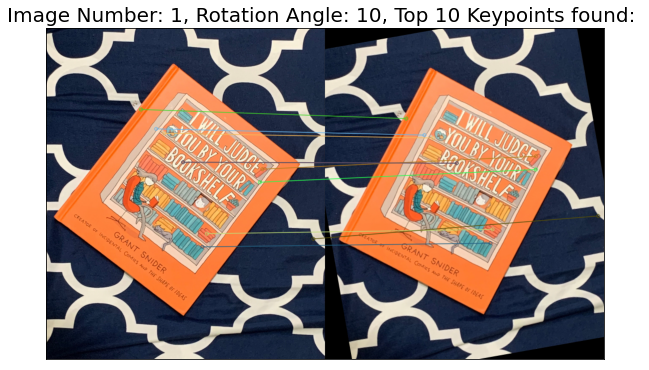

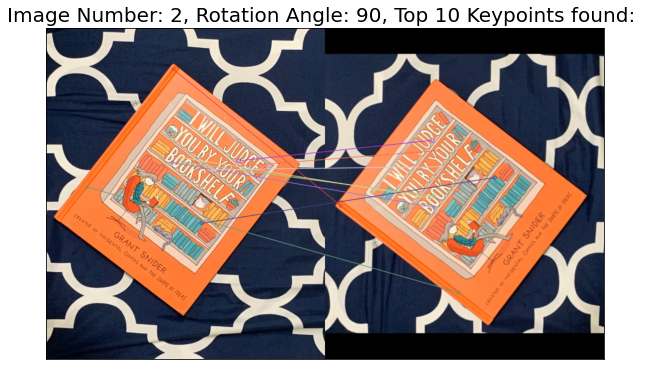

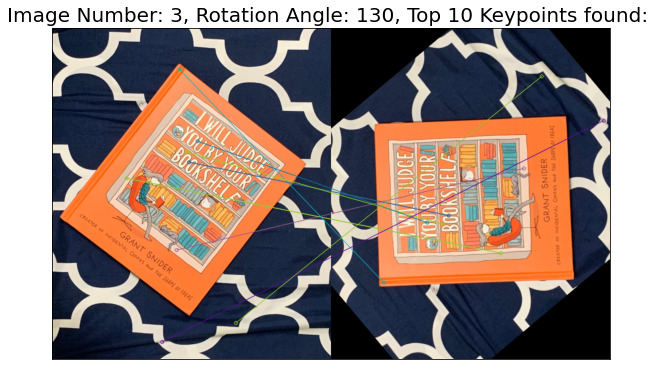

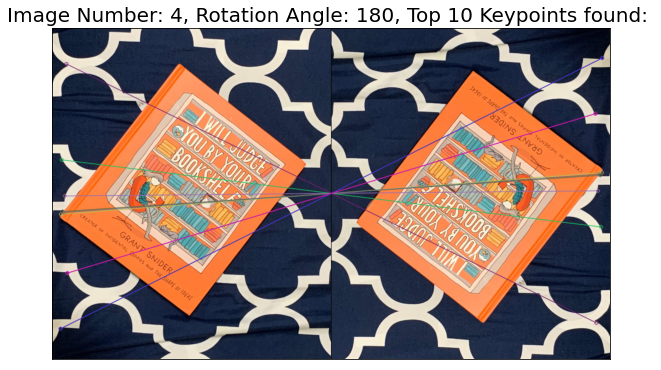

In [ ]:
for x in range(4):
  new_img =cv2.drawMatches(base_img,base_keys, images[x],keypoints[x],matches[x][:10],None,flags=2) #Draw matches on images 
  tit ="Image Number: "+str(x+1)+", Rotation Angle: "+str(angles[x])+ ", Top 10 Keypoints found: "
  display_img(new_img,tit)

####7 Plot the matching distance for the top 100 matched keypoints. Plot indices of keypoints on the x-axis and corresponding matching distance on the y-axis.

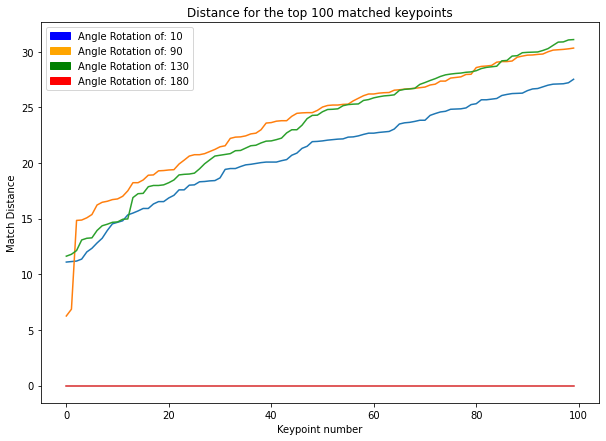

In [ ]:
line_color = ['blue', 'orange','green','red']
lines =[]
x_axis = np.arange(100)   
plt.figure(figsize=(10,7))
for x in range(4):
  plot_points =[]
  for a,b in enumerate(matches[x]):
    plot_points.append(b.distance)
  plt.plot(x_axis, plot_points[:100],label='Line 2')
  plt.title("Distance for the top 100 matched keypoints")
  plt.xlabel("Keypoint number")
  plt.ylabel("Match Distance")
  line= mpatches.Patch(color=line_color[x], label='Angle Rotation of: '+str(angles[x]))
  lines.append(line)

plt.legend(handles=[lines[0],lines[1], lines[2], lines[3]])
plt.show()

####8 Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Reason the cause.

In the Above graph, it seems that the anlges of 10,90,and 130 found nearly equivalent matching distance trends. However, as 180 degrees is a mirror image of the orignal image, it has matching distances as zero. It seems that distance is minimized if the rotation factor is a multiple of 180, as it will either be the same or a mirror of the original image. It seems that the peak of matching distance occurs at 90+180x for all x, this would be because the image is perpendicular from the original image. 

Matching distance from 0 to 180 degrees would appear as a very steep negative quadratic equation, peaking at 90 degrees. 

#3 Image Stitching

####1 Compute SIFT keypoints and corresponding descriptors for images 1Montreal and 2Montreal.

In [ ]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16
#Needed for SIFT to properly run

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Num Keypoints:1935


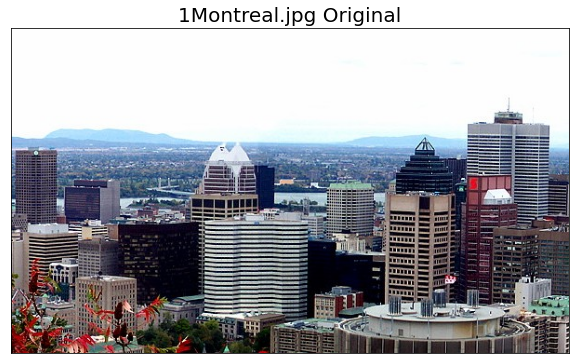

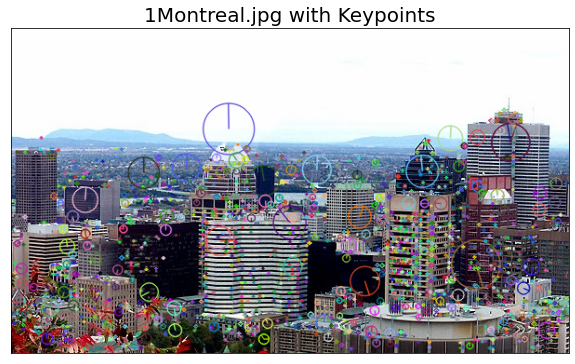

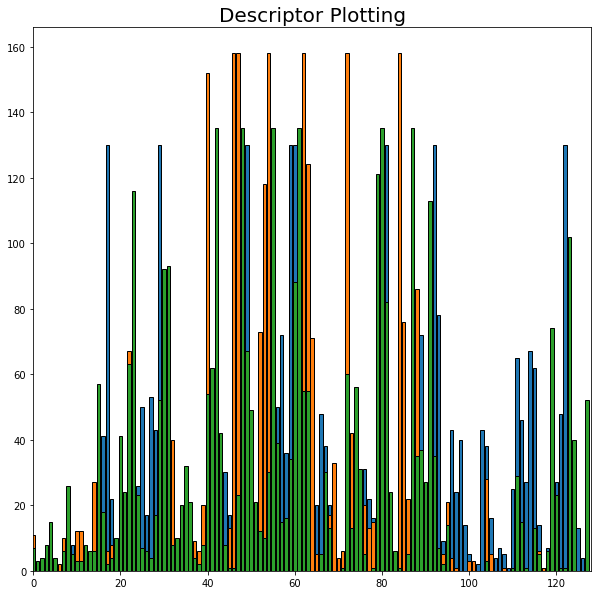

Num Keypoints:2256


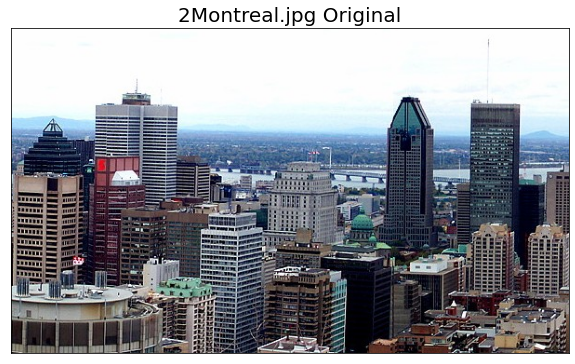

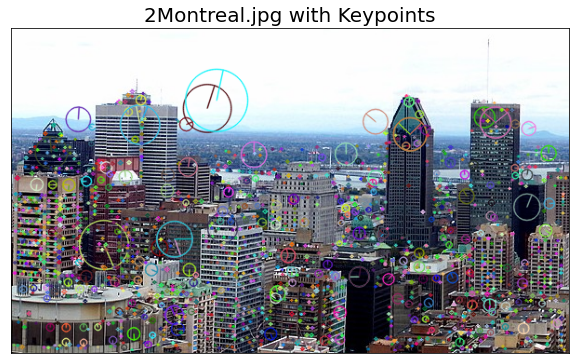

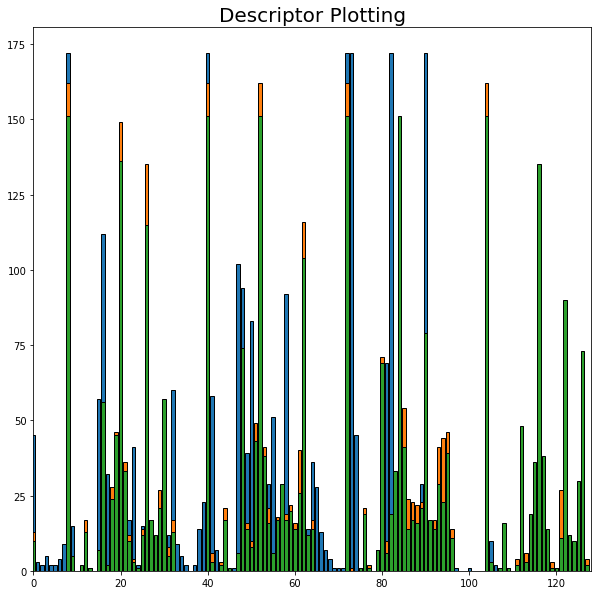

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

def display_img(image, title_input):
    plt.figure(figsize = (10, 10))
    plt.imshow(image)
    plt.xticks([]) 
    plt.yticks([]) 
    plt.title(title_input, fontsize = 20)

drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/ECSE 415/Assignment-2/'

  
img_path= drive_path+'images/1Montreal.jpg'
base_img1 = cv2.imread(img_path)
img_path= drive_path+'images/2Montreal.jpg'
base_img2 = cv2.imread(img_path)
#Create Copies for display purposes
disp_img1 = base_img1.copy()
disp_img2 = base_img2.copy()

base_img1 = cv2.cvtColor(base_img1,cv2.COLOR_BGR2RGB)
base_img2 = cv2.cvtColor(base_img2,cv2.COLOR_BGR2RGB)

disp_img1=cv2.cvtColor(disp_img1,cv2.COLOR_BGR2RGB)
disp_img2=cv2.cvtColor(disp_img1,cv2.COLOR_BGR2RGB)

sift_obj1 = cv2.xfeatures2d.SIFT_create()
sift_obj2 = cv2.xfeatures2d.SIFT_create()
keypoints1 = sift_obj1.detect(base_img1,None) #Find Keypoints
keypoints1, descriptors1 = sift_obj1.compute(base_img1, keypoints1) #Compute Desciptors 

keypoints2 = sift_obj2.detect(base_img2,None) #Find Keypoints
keypoints2, descriptors2 = sift_obj1.compute(base_img2, keypoints2)#Compute Desciptors
#Draw the Keypoints to a display image
cv2.drawKeypoints(base_img1, keypoints1, disp_img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(base_img2, keypoints2, disp_img2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_img(base_img1,"1Montreal.jpg Original")
print("Num Keypoints:" +str(len(keypoints1)))
display_img(disp_img1,"1Montreal.jpg with Keypoints")
plt.figure(figsize=(10,10))
for i in range(3):
    plt.bar(np.arange(0,128),descriptors1[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
    plt.title("Descriptor Plotting", fontsize = 20)
plt.show()
display_img(base_img2,"2Montreal.jpg Original")
print("Num Keypoints:" +str(len(keypoints2)))
display_img(disp_img2,"2Montreal.jpg with Keypoints")
plt.figure(figsize=(10,10))
for i in range(3):
    plt.bar(np.arange(0,128),descriptors2[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
    plt.title("Descriptor Plotting", fontsize = 20)
plt.show()


####2 Find matching keypoints in 1Montreal and 2Montreal images and display the 20 best pairs.

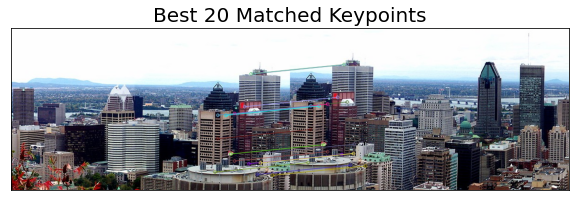

In [ ]:
#Creation of cv2's BF Matcher
bf_obj = cv2.BFMatcher()
#Use the object to match descriptors
matches_found = bf_obj.match(descriptors1,descriptors2)
#Sort to find Rank the matches
sorted_matches = sorted(matches_found, key=lambda x:x.distance)
match_img = cv2.drawMatches(base_img1,keypoints1,base_img2,keypoints2, sorted_matches[:20], None, flags=2)
display_img(match_img,"Best 20 Matched Keypoints")

####3 Find homography using the RANSAC method and apply the transformation to 1Montreal. Image 2Montreal should not be transformed.

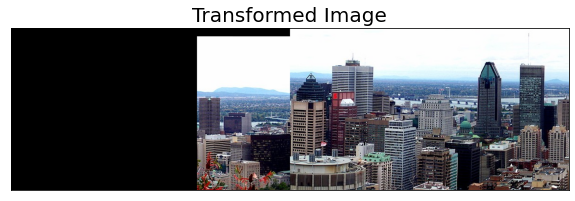

In [ ]:
GoodMatches = []
for i, m in enumerate(sorted_matches):
        GoodMatches.append((m.trainIdx, m.queryIdx))

mpr = np.float32([keypoints1[i].pt for (__, i) in GoodMatches])
mpl = np.float32([keypoints2[i].pt for (i, __) in GoodMatches])
H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)
wimg = cv2.warpPerspective(base_img1, H, (base_img2.shape[1]+base_img1.shape[1],base_img2.shape[0]))
wimg_temp = wimg.copy()
wimg[:base_img2.shape[0],base_img1.shape[1]:,:] = base_img2

display_img(wimg,"Transformed Image")


####4 Stitch transformed 1Montreal and the original 2Montreal together using linear image blending. Let us call this image 12Montreal. Display this image.

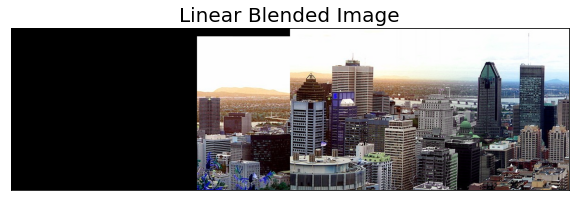

In [ ]:
def linear_Blend(img_w, ramp_w, ramp_num, init_ramp_val, end_ramp_val):#Linear blending method, iterates throught the image using numpy
  a = np.zeros((img_w))
  iteration = (end_ramp_val - init_ramp_val) / (ramp_w-1)
  idx = round(ramp_num - (ramp_w / 2)) 
  for i in range(ramp_w):
      a[idx] = init_ramp_val + iteration*i
      idx += 1
  a[idx:] = 1
  return a
img_a= wimg.copy()
img_b = wimg.copy()
img_a = cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)
init_ramp = 250
shp = img_a.shape[1]
linear_tst = linear_Blend(shp,init_ramp,round(shp-init_ramp),0,1)
reshp = linear_tst.reshape(1,-1,1)
blended_img = (1- reshp)* img_a + reshp*img_b
blended_img = np.uint(blended_img)
display_img(blended_img,"Linear Blended Image")
img_12montreal =wimg.copy()

####5 Compute SIFT keypoints and corresponding descriptors for images 12Montreal and 3Montreal

Num Keypoints:2662


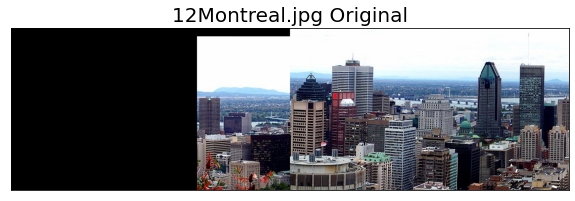

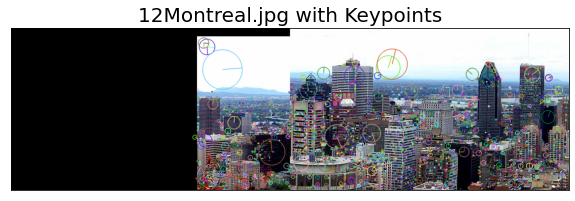

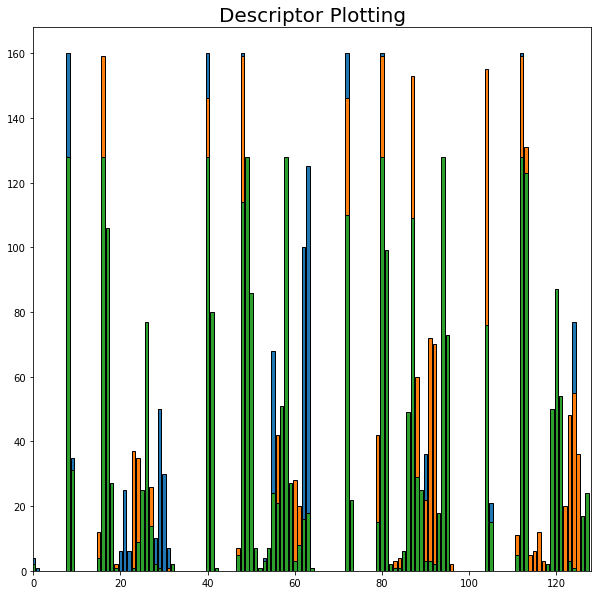

Num Keypoints:2206


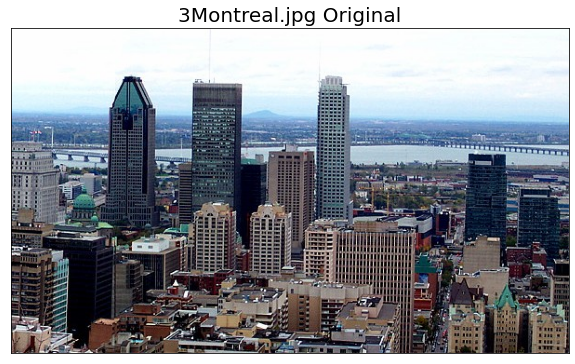

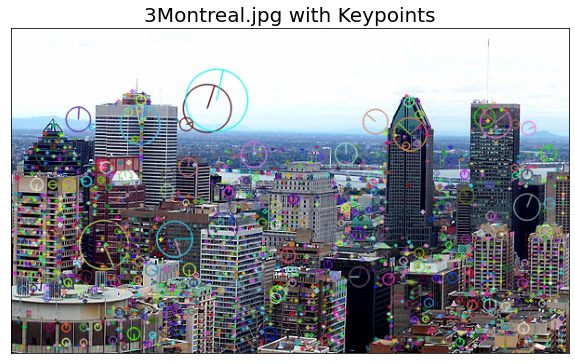

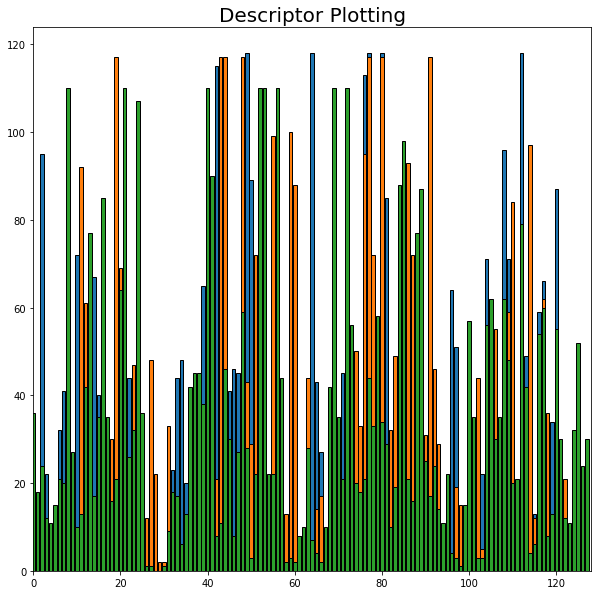

In [ ]:
img_path= drive_path+'images/3Montreal.jpg'
base_img3 = cv2.imread(img_path)
imgr = cv2.cvtColor(base_img3,cv2.COLOR_BGR2RGB)

keypoints1 = sift_obj1.detect(img_12montreal,None) #Find Keypoints
keypoints1, descriptors1 = sift_obj1.compute(img_12montreal, keypoints1) #Compute Desciptors 

keypoints2 = sift_obj2.detect(imgr,None) #Find Keypoints
keypoints2, descriptors2 = sift_obj1.compute(imgr, keypoints2)#Compute Desciptors
disp_img12=img_12montreal.copy()
disp_img3=imgr.copy()
#Draw Keypoints
cv2.drawKeypoints(img_12montreal, keypoints1, disp_img12, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(imgr, keypoints2, disp_img3, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Images printed and descriptor plots printed
display_img(img_12montreal,"12Montreal.jpg Original")
print("Num Keypoints:" +str(len(keypoints1)))
display_img(disp_img12,"12Montreal.jpg with Keypoints")
plt.figure(figsize=(10,10))
for i in range(3):
    plt.bar(np.arange(0,128),descriptors1[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
    plt.title("Descriptor Plotting", fontsize = 20)
plt.show()
display_img(imgr,"3Montreal.jpg Original")
print("Num Keypoints:" +str(len(keypoints2)))
display_img(disp_img2,"3Montreal.jpg with Keypoints")
plt.figure(figsize=(10,10))
for i in range(3):
    plt.bar(np.arange(0,128),descriptors2[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
    plt.title("Descriptor Plotting", fontsize = 20)
plt.show()

####6 Find matching keypoints in 12Montreal and 3Montreal images and display the 20 best pairs

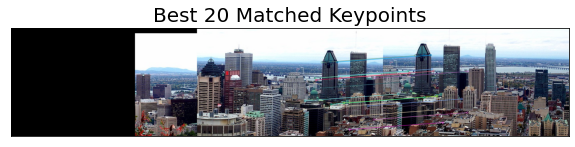

In [ ]:
#Creation of cv2's BF Matcher
bf_obj = cv2.BFMatcher()
#Use the object to match descriptors
matches_found = bf_obj.match(descriptors1,descriptors2)
#Sort to find Rank the matches
sorted_matches = sorted(matches_found, key=lambda x:x.distance)
match_img = cv2.drawMatches(img_12montreal,keypoints1,imgr,keypoints2, sorted_matches[:20], None, flags=2)
display_img(match_img,"Best 20 Matched Keypoints")

####7 Compute the homography using the RANSAC method. Apply the transformation to 3Montreal. Image 12Montreal should not be transformed.

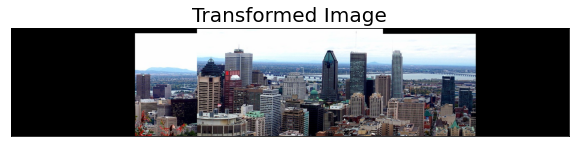

In [ ]:
GoodMatches = []
for i, m in enumerate(sorted_matches):
        GoodMatches.append((m.trainIdx, m.queryIdx))

mpr = np.float32([keypoints1[i].pt for (__, i) in GoodMatches])
mpl = np.float32([keypoints2[i].pt for (i, __) in GoodMatches])
H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)
wimg = cv2.warpPerspective(imgr, H, (imgr.shape[1]+img_12montreal.shape[1],imgr.shape[0]))
wimg[:,:img_12montreal.shape[1],:] = img_12montreal

display_img(wimg,"Transformed Image")

####8 Stitch transformed 3Montreal and 12Montreal together using linear image blending. Display the resulting image.

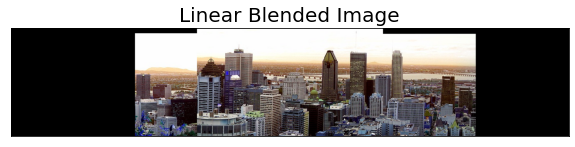

In [ ]:
img_a= wimg.copy()
img_b = wimg.copy()
img_a = cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)
init_ramp = 250
shp = img_a.shape[1]
#Linear Blend new image 
linear_tst = linear_Blend(shp,init_ramp,round(shp-init_ramp),0,1)
reshp = linear_tst.reshape(1,-1,1)
blended_img = (1- reshp)* img_a + reshp*img_b
blended_img = np.uint(blended_img)
#Display Final Image 
display_img(blended_img,"Linear Blended Image")

#4 Template Matching 

####1 Given a reference image (scene of Montreal Snow Festival) and a template face image, iterate over all pixel locations of the reference image and compare the local patch with the template image using the sum of square distance (SSD) metric. Implement this in NumPy (you are prohibited from using OpenCV function for this).

In [ ]:
drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/ECSE 415/Assignment-2/'

img_path= drive_path+'images/find_me_image.jpg'
base_img1 = cv2.imread(img_path)

disp_img = base_img1.copy()
img_path= drive_path+'images/template.jpg'
base_img2 = cv2.imread(img_path)
base_img1 =cv2.cvtColor(base_img1, cv2.COLOR_BGR2RGB)
disp_img =cv2.cvtColor(disp_img, cv2.COLOR_BGR2RGB)
template =cv2.cvtColor(base_img2,cv2.COLOR_BGR2RGB)
h,w,t = template.shape
#cv2 method placeholder to find square difference, to be changed 
res = cv2.matchTemplate(disp_img, template, cv2.TM_SQDIFF)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


####2 Display SSD for the whole image. Find the location ((x, y) coordinate) where the SSD is minimum and see if you can find the person there!

The girl can be located at an expected:  (251, 459)


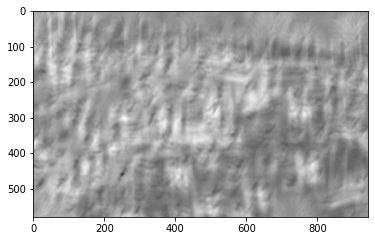

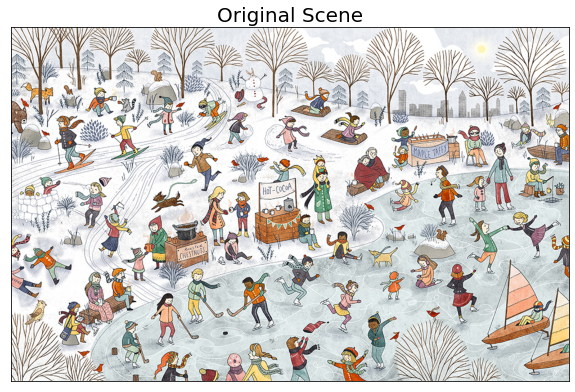

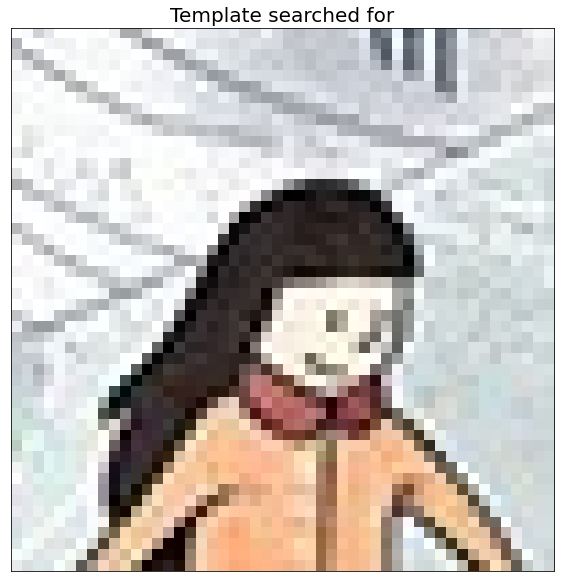

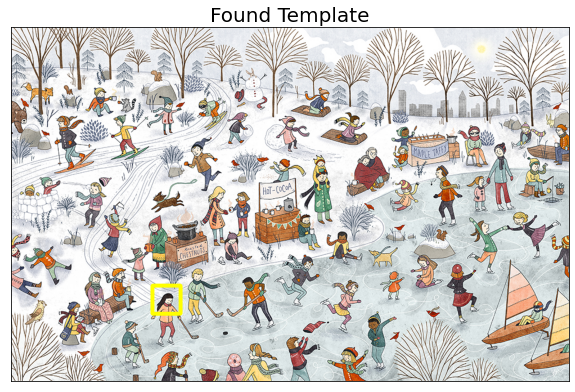

In [ ]:
plt.imshow(res, cmap="gray")
#Intended Solution to find minimum
_,_,found_min,_ =cv2.minMaxLoc(res)

pixel_data = (255,255,0)
print("The girl can be located at an expected: ", found_min)
rectangle_bound = (found_min[0]+w,found_min[1]+h)
#Creates a rectangle around the image
cv2.rectangle(disp_img,found_min,rectangle_bound,pixel_data,5)

display_img(base_img1,"Original Scene") 
display_img(template,"Template searched for")
display_img(disp_img,"Found Template")

####3 Repeat the above process with the noisy template as shown in Figure:4(c).

The girl can be located at an expected:  (251, 459)


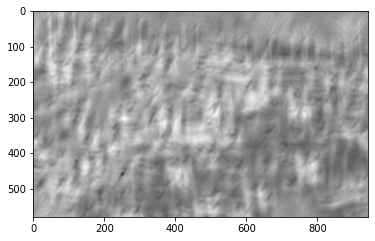

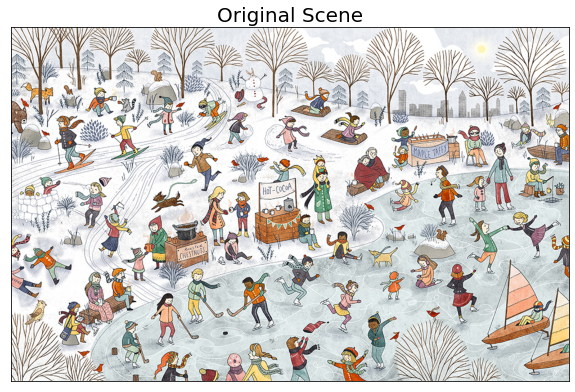

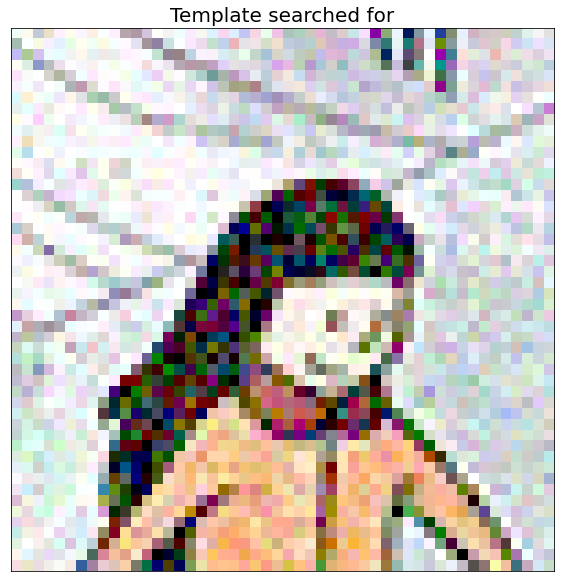

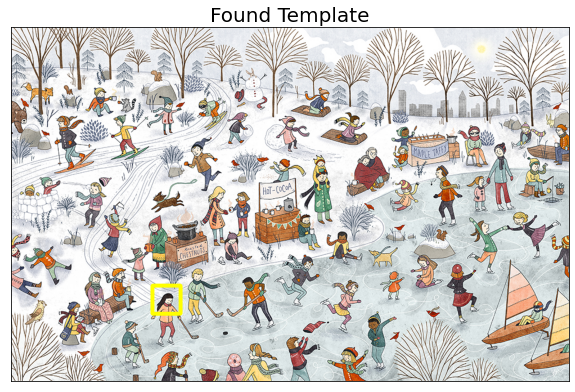

In [ ]:
disp_img = base_img1.copy()
img_path= drive_path+'images/template_noisy.jpg'
base_img3 = cv2.imread(img_path)
template =cv2.cvtColor(base_img3,cv2.COLOR_BGR2RGB)
h,w,t = template.shape
#Intended Solution to finding Square difference, to be changed 
res = cv2.matchTemplate(disp_img, template, cv2.TM_SQDIFF)
plt.imshow(res, cmap="gray")
#Intended Solution to find minimum
_,_,found_min,_ =cv2.minMaxLoc(res)
print("The girl can be located at an expected: ", found_min) #Print Minimum location found
rectangle_bound = (found_min[0]+w,found_min[1]+h)
#Creates a rectangle around the image
cv2.rectangle(disp_img,found_min,rectangle_bound,pixel_data,5)

display_img(base_img1,"Original Scene") 
display_img(template,"Template searched for")
display_img(disp_img,"Found Template")